In [18]:
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import re
import os



In [28]:
dir_path = r"C:\Users\hwilson23\Documents\GitHub\collagen_3D_multimetric-main"

filelist = [
    f for f in os.listdir(dir_path)
    if "current_final_dataframe_byslice_pos" in f
]

# =========================
# LOAD FILES
# =========================
all_frames = []
for f in filelist:
    df = pd.read_csv(os.path.join(dir_path, f))

    # Drop exact column names
    DROP_COLS = [
        'TotalImageArea', 'distance3d', 'neighbor3d',
        'bin_num3d', 'roi', 'type'
    ]
    df = df.drop(DROP_COLS, axis=1, errors='ignore')

    # Drop columns matching any substring pattern
    DROP_PATTERNS = ['distance3d', 'bin_num3d', 'slice_full']
    pattern_cols = [c for c in df.columns if any(p in c for p in DROP_PATTERNS)]
    df = df.drop(pattern_cols, axis=1, errors='ignore')

    # Drop pandas duplicate columns (fibercount.1, z_depth.2 etc.)
    dupe_cols = [c for c in df.columns if re.search(r'\.\d+$', c)]
    df = df.drop(dupe_cols, axis=1, errors='ignore')
    
    df['concentration'] = df['image_name'].str.extract(r"(\d+mgml)")
    if 'position' not in df.columns:
        pos_match = re.search(r'pos_(\d+)', f, flags=re.IGNORECASE)
        df['position'] = int(pos_match.group(1)) if pos_match else np.nan
    all_frames.append(df)


combined = pd.concat(all_frames, ignore_index=True)
combined["position"] = combined["position"].astype("Int64")
combined["slice_id"] = combined["slice"].astype(str) + "_" + combined["position"].astype(str)


# =========================
# TIMEPOINT FIX
# =========================
for c in combined.columns:
    if col.startswith("timepoint"):
        combined["timepoint"] = combined[c]
# =========================
# ID VARS — build dynamically from what actually exists
# =========================
CANDIDATE_ID_VARS = ["image_name", "slice_id", "position", "timepoint", "concentration"]
id_vars = [c for c in CANDIDATE_ID_VARS if c in combined.columns]
print("ID VARS FOUND:", id_vars)

# =========================
# MASK CLASSIFIER
# =========================
def get_mask(col):
    parts = col.lower().split("_")
    # Handle mean_/median_/std_/n_ naming: mean_a1_metric, mean_full_metric etc.
    if len(parts) >= 2 and parts[1] in ("a1", "a2", "full", "cell"):
        if parts[1] == "cell":
            return "cell_masked"
        return parts[1]
    # Suffix-style naming: metric_a1, metric_full etc.
    if "cell" in parts:
        return "cell_masked"
    elif "a1" in parts:
        return "a1"
    elif "a2" in parts:
        return "a2"
    elif "full" in parts:
        return "full"
    return "full"

# =========================
# BUILD COLUMN GROUPS — whitelist only known feature prefixes
# =========================
FEATURE_PREFIXES = (
    "texture",        # catches TWOMBLI + texture3d
    "fibercount",
    "mean_",
    "median_",
    "std_",
    "n_",
    "z_depth",
    "Area",
    "Lacunarity",
    "Alignment",
    "Total",
              'Endpoints', 'HGU (microns)', 'Branchpoints', 'Box-Counting Fractal Dimension', '% High Density Matrix'          # if present
)
mask_groups = {"full": [], "a1": [], "a2": [], "cell_masked": []}
skipped = []

for col in combined.columns:
    if col in id_vars:
        continue
    if not col.startswith(FEATURE_PREFIXES):
        skipped.append(col)
        continue
    mask_groups[get_mask(col)].append(col)

print("\nSKIPPED COLUMNS (not in any feature group):")
print(skipped)

print("\nCOLUMNS PER MASK GROUP:")
for mask, cols in mask_groups.items():
    print(f"  {mask}: {len(cols)} cols — sample: {cols[:3]}")

# =========================
# MELT
# =========================
long_frames = []
for mask_type, cols in mask_groups.items():
    if len(cols) == 0:
        continue
    temp = combined[id_vars + cols].melt(
        id_vars=id_vars,
        value_vars=cols,
        var_name="feature",
        value_name="value"
    )
    temp["mask_type"] = mask_type
    long_frames.append(temp)

long = pd.concat(long_frames, ignore_index=True)

'''
def clean_feature_name(col):
    parts = col.split("_")
    # Middle-mask style: mean_a1_metric → mean_metric
    if len(parts) >= 3 and parts[1].lower() in ("a1", "a2", "full", "cell"):
        return parts[0] + "_" + "_".join(parts[2:])
    # Suffix style: metric_a1 → metric
    for suffix in ("_full", "_a1", "_a2", "_cell", "_cell_masked"):
        if col.endswith(suffix):
            return col[: -len(suffix)]
    return col
'''
def clean_feature_name(col):
    tags = r'(?:_cell_masked|_a1_masked|_a2_masked|_a1|_a2|_full|_cell)(?=_|$)'
    return re.sub(tags, '', col)

# =========================
# CLEAN — must happen BEFORE groupby
# =========================
long["value"] = pd.to_numeric(long["value"], errors="coerce")
long = long.dropna(subset=["value"])

long["feature"] = long["feature"].apply(clean_feature_name)

# Verify cleaned names look right
print("FEATURE SAMPLE AFTER CLEAN:")
print(long["feature"].unique()[:10])

# =========================
# AGGREGATE
# =========================
grouped = (
    long
    .groupby(
        ["position", "timepoint", "slice_id", "mask_type", "feature"],
        as_index=False
    )
    .agg(value=("value", "mean"))
)

# Verify all 4 masks present per feature
print("\nMASK CHECK FOR autoc:")
print(
    grouped[grouped["feature"].str.contains("autoc", na=False)]
    [["feature", "mask_type"]]
    .drop_duplicates()
    .sort_values("feature")
)

print("\nFEATURE EXAMPLES:")
print(grouped["feature"].unique()[:10])

print("\nMASK DISTRIBUTION:")
print(grouped["mask_type"].value_counts())



ID VARS FOUND: ['image_name', 'slice_id', 'position', 'timepoint', 'concentration']

SKIPPED COLUMNS (not in any feature group):
['slice', 'timepoint_full_idmnc']

COLUMNS PER MASK GROUP:
  full: 76 cols — sample: ['fibercount', 'z_depth', 'Area (microns^2)']
  a1: 77 cols — sample: ['mean_a1_HistANG', 'mean_a1_HistLEN', 'mean_a1_HistSTR']
  a2: 77 cols — sample: ['mean_a2_HistANG', 'mean_a2_HistLEN', 'mean_a2_HistSTR']
  cell_masked: 77 cols — sample: ['mean_cell_HistANG', 'mean_cell_HistLEN', 'mean_cell_HistSTR']
FEATURE SAMPLE AFTER CLEAN:
['fibercount' 'z_depth' 'Area (microns^2)' 'Lacunarity'
 'Total Length (microns)' 'Endpoints' 'HGU (microns)' 'Branchpoints'
 'Box-Counting Fractal Dimension' '% High Density Matrix']

MASK CHECK FOR autoc:
                    feature    mask_type
46     texture3d_mean_autoc         full
124    texture3d_mean_autoc           a1
201    texture3d_mean_autoc           a2
278    texture3d_mean_autoc  cell_masked
68   texture3d_median_autoc         ful

Skipped texture cols: []


C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


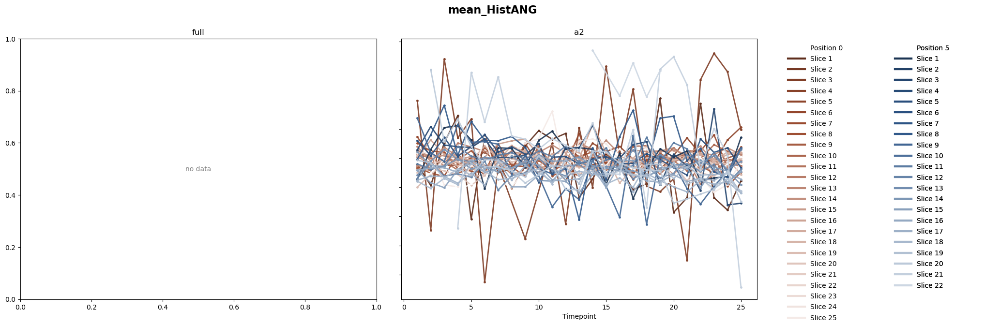

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


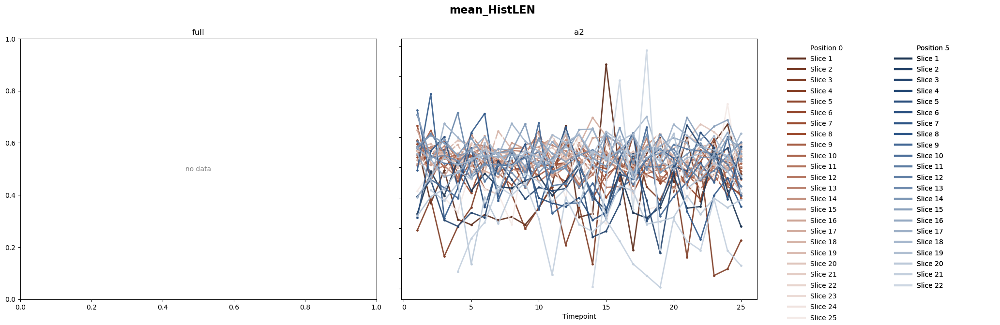

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


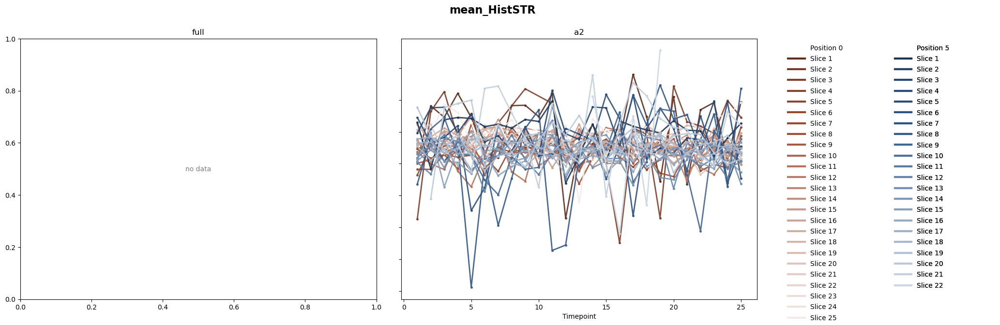

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


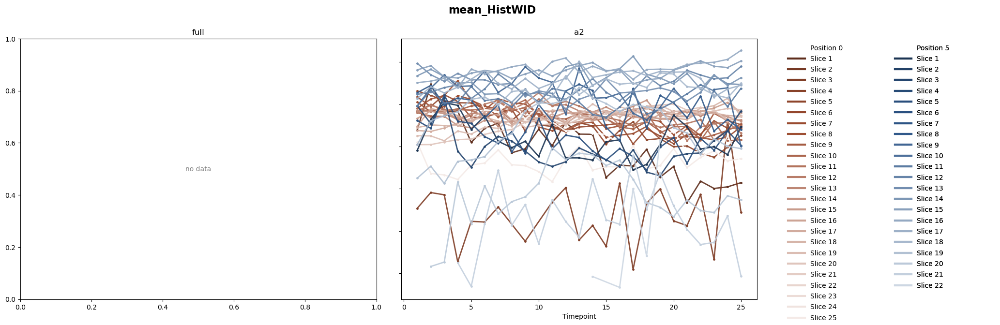

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


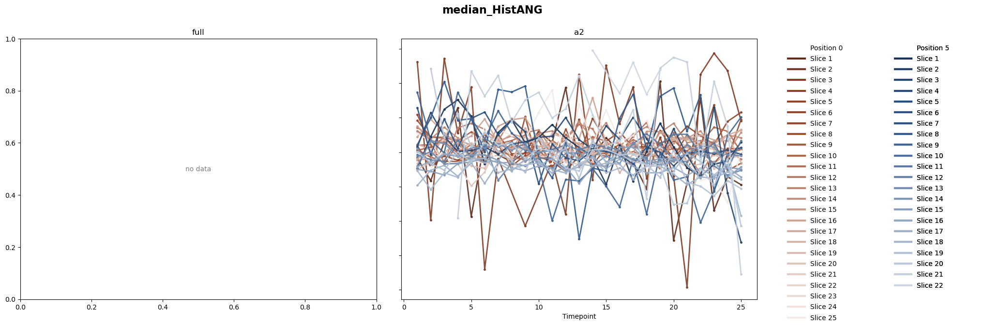

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


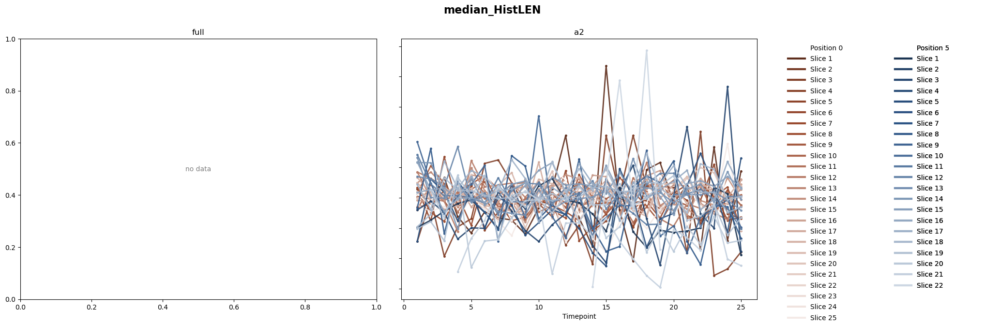

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


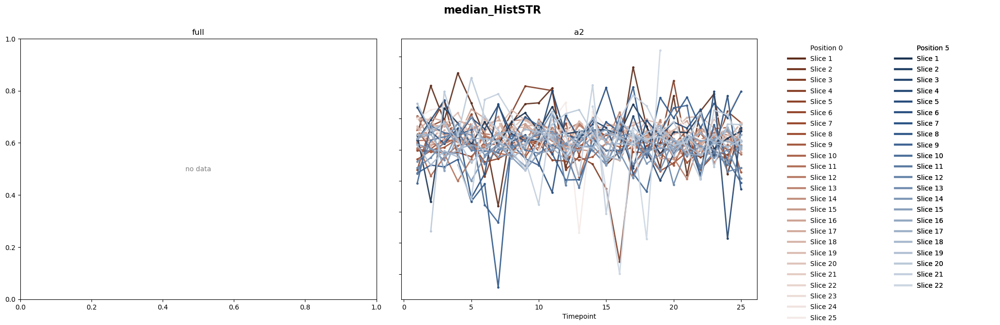

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


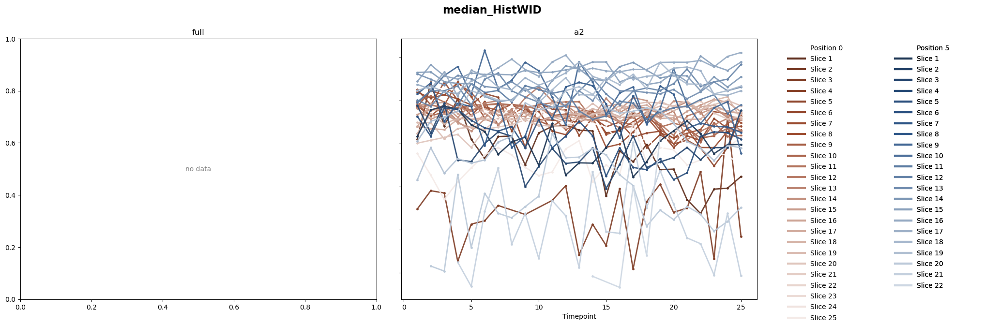

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


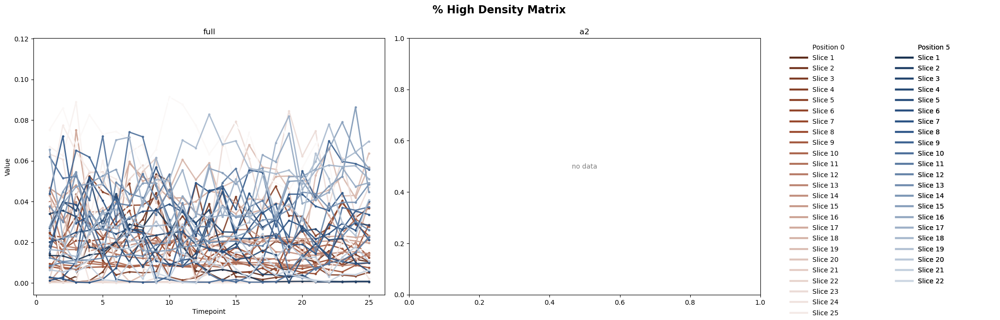

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


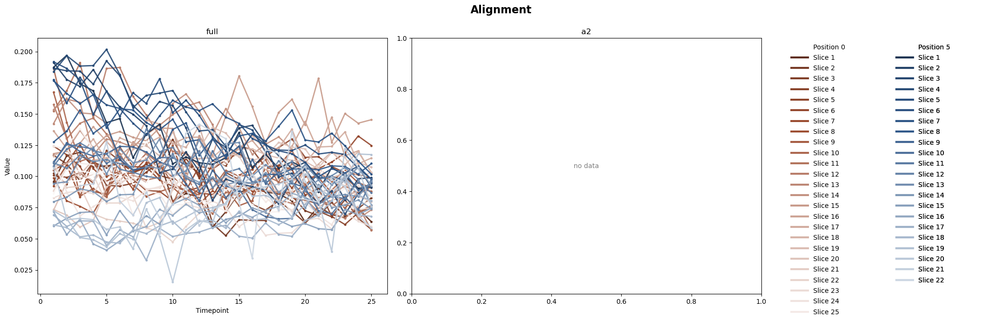

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


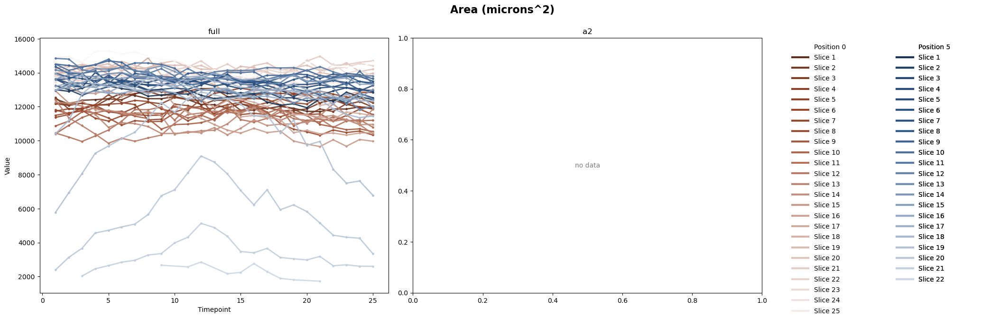

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


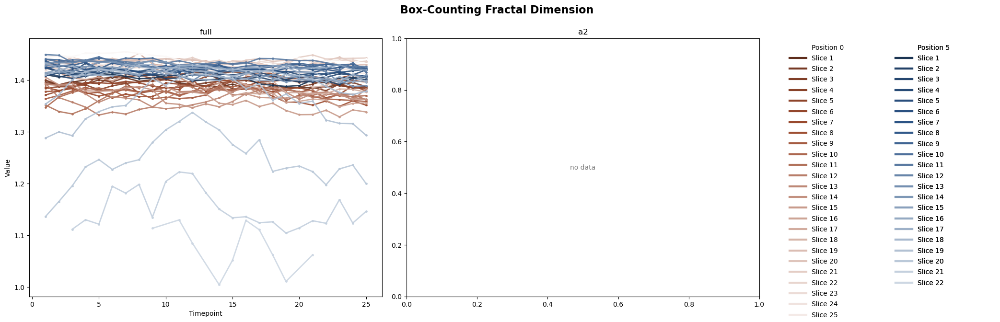

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


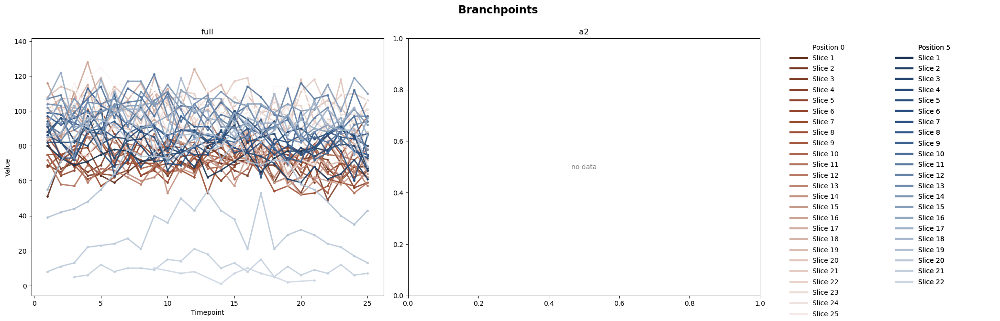

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


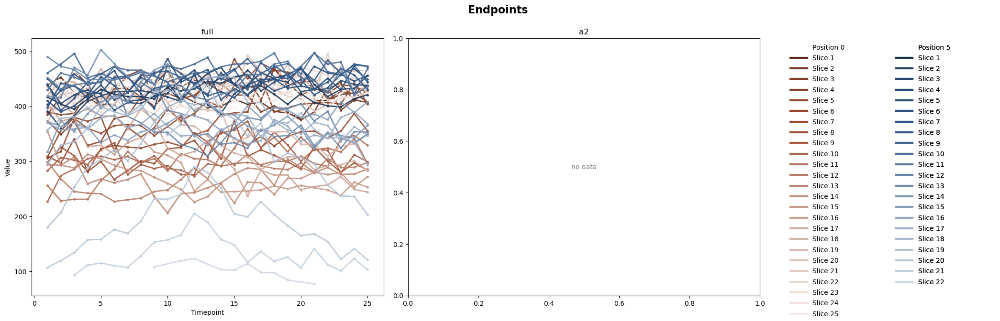

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


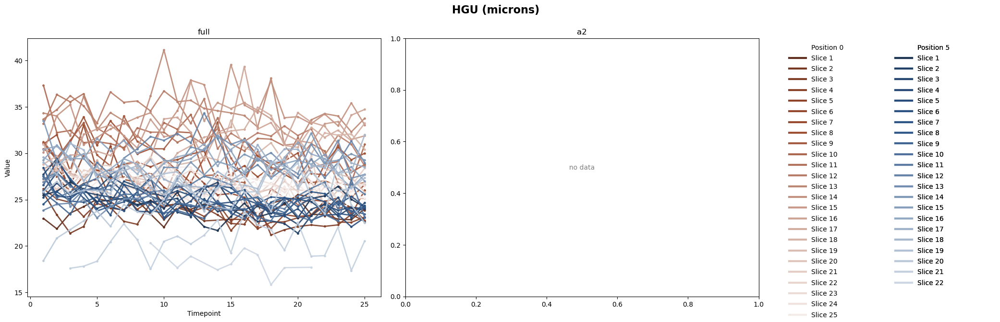

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


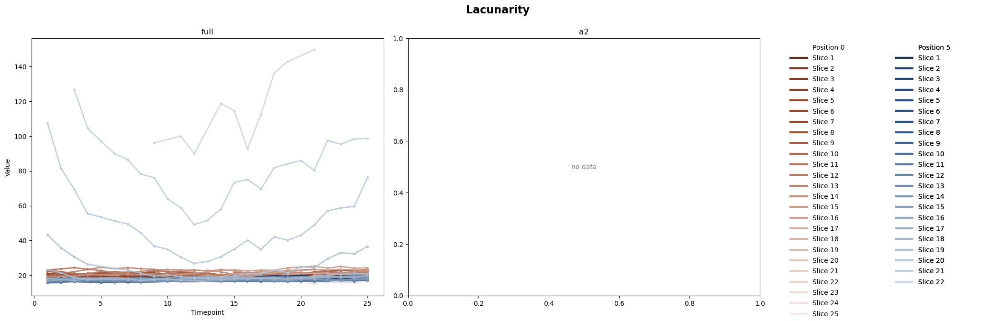

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


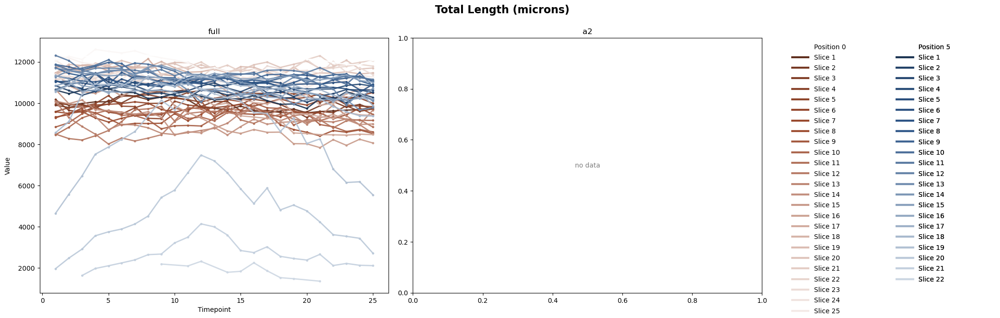

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


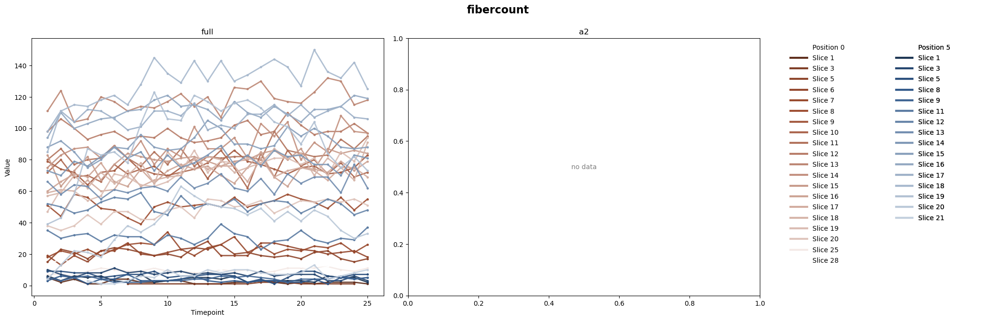

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


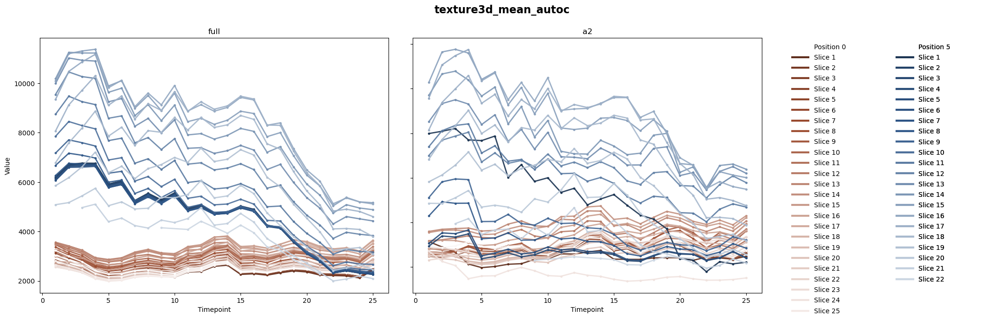

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


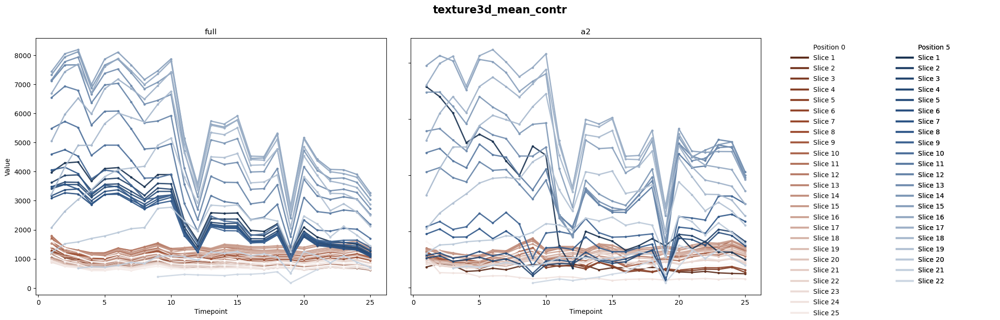

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


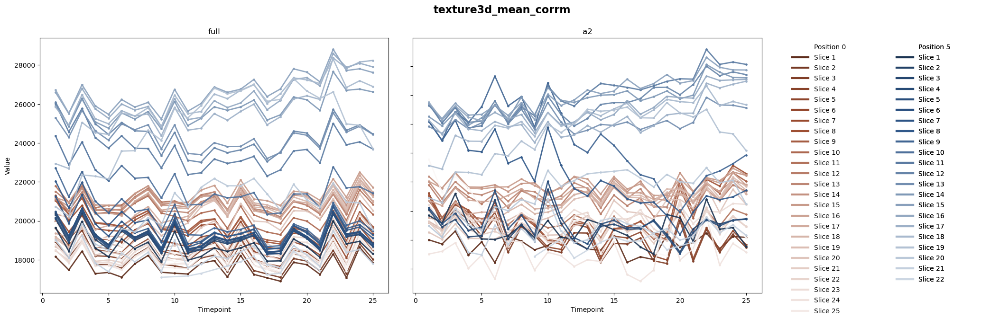

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


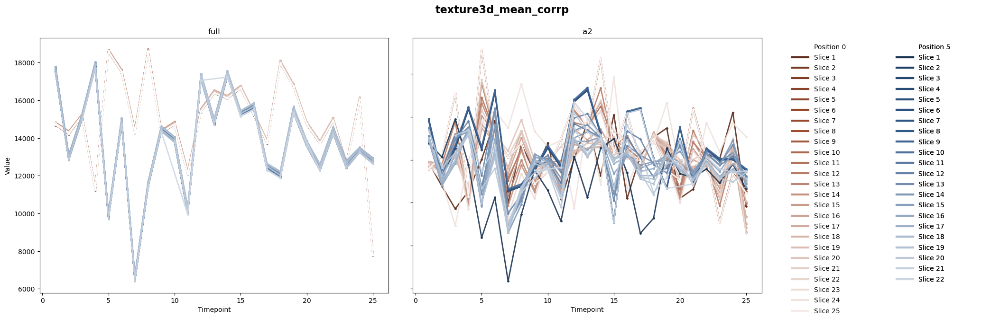

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


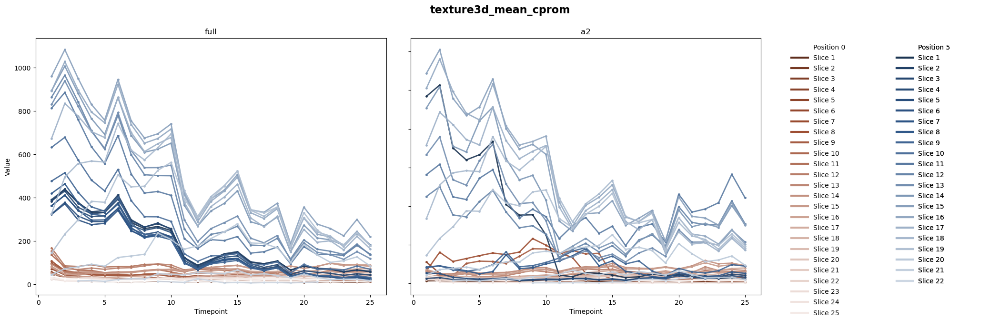

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


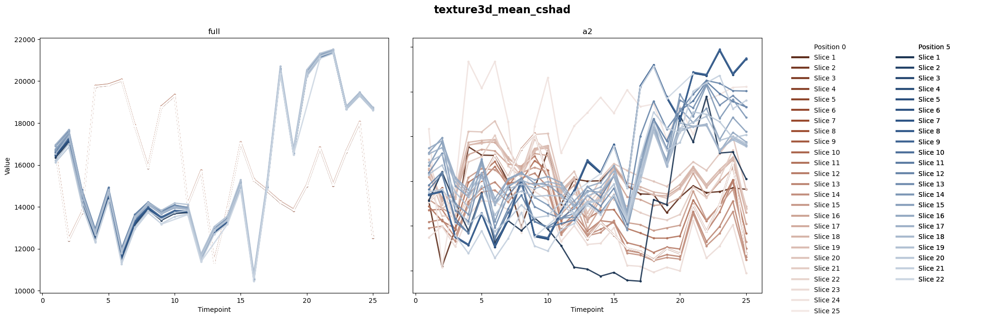

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


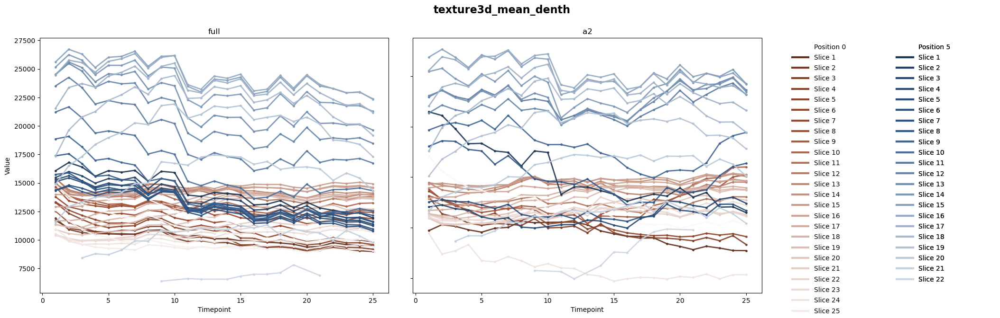

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


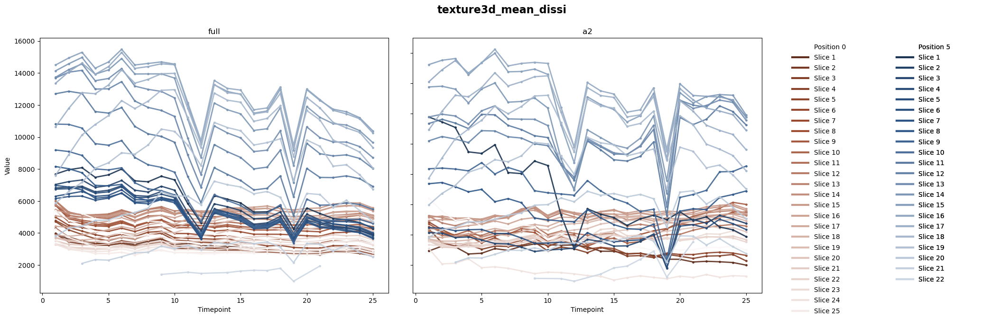

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


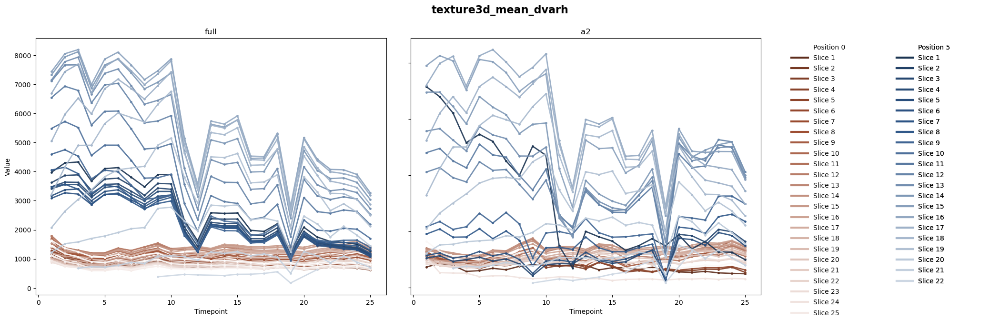

C:\Users\hwilson23\AppData\Local\Temp\ipykernel_25932\2359176762.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


In [ ]:
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap, Normalize
from matplotlib.lines import Line2D

#MASK_ORDER = ["full", "a1","a2","cell_masked"]
MASK_ORDER = ["full","a2"]

POS_CMAPS = [
    LinearSegmentedColormap.from_list("pos0", ["#f7b267", "#7f2a1d"]),
    LinearSegmentedColormap.from_list("pos1", ["#9ecae1", "#08306b"]),
    LinearSegmentedColormap.from_list("pos2", ["#a1d99b", "#00441b"]),
]

EXCLUDE_PREFIXES = ("std_",)
features_to_plot = [
    f for f in grouped["feature"].unique()
    if not f.startswith(EXCLUDE_PREFIXES)
]

for feat in features_to_plot:
    subset = grouped[grouped["feature"] == feat].copy()
    subset["slice"] = subset["slice_id"].str.split("_").str[0].astype(int)

    positions = sorted(subset["position"].dropna().unique())
    slices    = sorted(subset["slice"].dropna().unique())

    if len(slices) > 1:
        slice_norm = Normalize(vmin=min(slices), vmax=max(slices))
    else:
        slice_norm = Normalize(vmin=0, vmax=1)

    def apply_depth_intensity(rgb, slc):
        rgb = np.array(mcolors.to_rgb(rgb))

        x = np.clip(slice_norm(slc), 0, 1)
        x = x**0.5  # keeps early separation strong

        dark = rgb * 0.6      # darker version of base color
        light = np.ones(3)    # white

        # split range: first dark → base → light
        if x < 0.5:
            t = x / 0.5
            out = (1 - t) * dark + t * rgb
        else:
            t = (x - 0.5) / 0.5
            out = (1 - t) * rgb + t * light

        return np.clip(out, 0, 1)

    pos_to_cmap = {
        p: POS_CMAPS[i % len(POS_CMAPS)]
        for i, p in enumerate(positions)
    }

    def get_base_color(pos):
        return pos_to_cmap[pos](0.75)

    # ── Figure ──────────────────────────────────
    fig = plt.figure(figsize=(26, 7))
    gridnum = len(MASK_ORDER) + 1  # one col per mask + legend
    gs = fig.add_gridspec(1, gridnum, width_ratios=[5] * len(MASK_ORDER) + [3], wspace=0.08)  # mask cols + legend
    axes = [fig.add_subplot(gs[i]) for i in range(len(MASK_ORDER))]                        # one ax per mask
    leg_ax = fig.add_subplot(gs[-1]) #was 4
    leg_ax.axis("off")

    # ── Plotting ─────────────────────────────────
    for ax_i, (ax, mask) in enumerate(zip(axes, MASK_ORDER)):   # now zips all 4
        mask_data = subset[subset["mask_type"] == mask]

        if mask_data.empty:
            ax.set_title(mask)
            ax.text(0.5, 0.5, "no data", ha="center", va="center",
                    transform=ax.transAxes, color="gray")
            continue

        for pos in positions:
            base_color = get_base_color(pos)
            pos_data = mask_data[mask_data["position"] == pos]

            for slc in slices:
                line_data = pos_data[pos_data["slice"] == slc].sort_values("timepoint")
                if line_data.empty:
                    continue
                ax.plot(
                    line_data["timepoint"],
                    line_data["value"],
                    color=apply_depth_intensity(base_color, slc),
                    linewidth=2,
                    marker="o",
                    markersize=2.5,
                    alpha=0.9,
                )

        ax.set_title(mask)
        ax.set_xlabel("Timepoint")
        if ax_i == 0:
            ax.set_ylabel("Value")
        else:
            ax.tick_params(labelleft=False)
    # ── Legend ───────────────────────────────────
    leg_ax.set_xlim(0, len(positions))
    leg_ax.set_ylim(0, 1)

    for col_i, pos in enumerate(positions):
        pos_slices = sorted(
            subset[subset["position"] == pos]["slice"].dropna().unique().astype(int)
        )
        x_pos = col_i / len(positions)

        handles = [Line2D([0], [0], color="none", label=f"Position {pos}")] + [
            Line2D([0], [0],
                   color=apply_depth_intensity(get_base_color(pos), slc),
                   linewidth=3,
                   label=f"Slice {slc}")
            for slc in pos_slices
        ]

        leg = leg_ax.legend(
            handles=handles,
            loc="upper left",
            bbox_to_anchor=(x_pos, 1.0),
            bbox_transform=leg_ax.transAxes,
            fontsize=10,
            frameon=False,
            ncol=1,
            handlelength=2.5,
            labelspacing=0.6,
        )
        leg_ax.add_artist(leg)  # ← preserve previous legends

    # ── Show ─────────────────────────────────────
    fig.suptitle(feat, fontsize=16, fontweight="bold")
    fig.tight_layout()
    plt.show()
    plt.close(fig)

    # ── Save / show ──────────────────────────────
    #plt.savefig(os.path.join(dir_path, f"plot_{feat}.png"), dpi=150, bbox_inches="tight")
    #plt.close(fig)
    plt.show()